## Library version check

In [1]:
import sys
import sktime
import tqdm as tq
import xgboost as xgb
import matplotlib
import seaborn as sns
import sklearn as skl
import pandas as pd
import numpy as np
print("-------------------------- Python & library version --------------------------")
print("Python version: {}".format(sys.version))
print("pandas version: {}".format(pd.__version__))
print("numpy version: {}".format(np.__version__))
print("matplotlib version: {}".format(matplotlib.__version__))
print("tqdm version: {}".format(tq.__version__))
print("sktime version: {}".format(sktime.__version__))
print("xgboost version: {}".format(xgb.__version__))
print("seaborn version: {}".format(sns.__version__))
print("scikit-learn version: {}".format(skl.__version__))
print("------------------------------------------------------------------------------")

-------------------------- Python & library version --------------------------
Python version: 3.8.5 (default, Sep  3 2020, 21:29:08) [MSC v.1916 64 bit (AMD64)]
pandas version: 1.5.2
numpy version: 1.21.6
matplotlib version: 3.5.2
tqdm version: 4.64.1
sktime version: 0.20.1
xgboost version: 1.7.2
seaborn version: 0.11.2
scikit-learn version: 1.1.3
------------------------------------------------------------------------------


## 0. load the libararies

In [ ]:
import matplotlib.pyplot as plt
from tqdm import tqdm
from sktime.forecasting.model_selection import temporal_train_test_split
from sklearn.model_selection import StratifiedKFold , KFold
from sktime.utils.plotting import plot_series
from xgboost import XGBRegressor
import warnings
warnings.filterwarnings(action='ignore')

pd.set_option('display.max_columns', 30)

## 1. preprocessing the data

In [3]:
train = pd.read_csv('./data/train.csv')
train

,num_date_time,건물번호,일시,기온(C),강수량(mm),풍속(m/s),습도(%),일조(hr),일사(MJ/m2),전력소비량(kWh)
0,1_20220601 00,1,20220601 00,18.6,NaN,0.9,42.0,NaN,NaN,1085.28
1,1_20220601 01,1,20220601 01,18.0,NaN,1.1,45.0,NaN,NaN,1047.36
2,1_20220601 02,1,20220601 02,17.7,NaN,1.5,45.0,NaN,NaN,974.88
3,1_20220601 03,1,20220601 03,16.7,NaN,1.4,48.0,NaN,NaN,953.76
4,1_20220601 04,1,20220601 04,18.4,NaN,2.8,43.0,NaN,NaN,986.40
...,...,...,...,...,...,...,...,...,...,...
203995,100_20220824 19,100,20220824 19,23.1,NaN,0.9,86.0,0.5,NaN,881.04
203996,100_20220824 20,100,20220824 20,22.4,NaN,1.3,86.0,0.0,NaN,798.96
203997,100_20220824 21,100,20220824 21,21.3,NaN,1.0,92.0,NaN,NaN,825.12
203998,100_20220824 22,100,20220824 22,21.0,NaN,0.3,94.0,NaN,NaN,640.08


In [4]:
#결측치 확인(train)
def check_missing_col(dataframe):
    missing_col = []
    counted_missing_col = 0
    for i, col in enumerate(dataframe.columns):
        missing_values = sum(dataframe[col].isna())
        is_missing = True if missing_values >= 1 else False
        if is_missing:
            counted_missing_col += 1
            print(f'결측치가 있는 컬럼은: {col}입니다')
            print(f'해당 컬럼에 총 {missing_values}개의 결측치가 존재합니다.')
#            missing_col.append([col, dataframe[col].dtype])
    if counted_missing_col == 0:
        print('결측치가 존재하지 않습니다')
    return "완료"

display(check_missing_col(train))

결측치가 있는 컬럼은: 강수량(mm)입니다
해당 컬럼에 총 160069개의 결측치가 존재합니다.
결측치가 있는 컬럼은: 풍속(m/s)입니다
해당 컬럼에 총 19개의 결측치가 존재합니다.
결측치가 있는 컬럼은: 습도(%)입니다
해당 컬럼에 총 9개의 결측치가 존재합니다.
결측치가 있는 컬럼은: 일조(hr)입니다
해당 컬럼에 총 75182개의 결측치가 존재합니다.
결측치가 있는 컬럼은: 일사(MJ/m2)입니다
해당 컬럼에 총 87913개의 결측치가 존재합니다.


'완료'

In [5]:
#전력소비량 이상치 처리(건물번호를 기준)
for num in tqdm(range(train['건물번호'].nunique())):
    train.loc[train['건물번호'] == num+1, '전력소비량(kWh)'] = train.loc[train['건물번호'] == num+1, '전력소비량(kWh)'].clip(train.loc[train['건물번호'] == num+1, '전력소비량(kWh)'].quantile(.01), train.loc[train['건물번호'] == num+1, '전력소비량(kWh)'].quantile(.99))

100%|███████████████████████████████████████████████████████████████████████████████| 100/100 [00:00<00:00, 210.13it/s]


In [6]:
#일조, 일사 결측치 처리1
train.loc[train.num_date_time.str[-2:] == "00", "일조(hr)"] = 0.0
train.loc[train.num_date_time.str[-2:] == "01", "일조(hr)"] = 0.0
train.loc[train.num_date_time.str[-2:] == "02", "일조(hr)"] = 0.0
train.loc[train.num_date_time.str[-2:] == "03", "일조(hr)"] = 0.0
train.loc[train.num_date_time.str[-2:] == "04", "일조(hr)"] = 0.0
train.loc[train.num_date_time.str[-2:] == "05", "일조(hr)"] = 0.0
train.loc[train.num_date_time.str[-2:] == "21", "일조(hr)"] = 0.0
train.loc[train.num_date_time.str[-2:] == "22", "일조(hr)"] = 0.0
train.loc[train.num_date_time.str[-2:] == "23", "일조(hr)"] = 0.0

train.loc[train.num_date_time.str[-2:] == "00", "일사(MJ/m2)"] = 0.0
train.loc[train.num_date_time.str[-2:] == "01", "일사(MJ/m2)"] = 0.0
train.loc[train.num_date_time.str[-2:] == "02", "일사(MJ/m2)"] = 0.0
train.loc[train.num_date_time.str[-2:] == "03", "일사(MJ/m2)"] = 0.0
train.loc[train.num_date_time.str[-2:] == "04", "일사(MJ/m2)"] = 0.0
train.loc[train.num_date_time.str[-2:] == "05", "일사(MJ/m2)"] = 0.0
train.loc[train.num_date_time.str[-2:] == "21", "일사(MJ/m2)"] = 0.0
train.loc[train.num_date_time.str[-2:] == "22", "일사(MJ/m2)"] = 0.0
train.loc[train.num_date_time.str[-2:] == "23", "일사(MJ/m2)"] = 0.0

In [7]:
#일조, 일사 결측치 처리2
train.loc[train['일조(hr)'].isna() & train['강수량(mm)'] > 0, "일조(hr)"] = 0.0
train.loc[train['일사(MJ/m2)'].isna() & train['강수량(mm)'] > 0, "일사(MJ/m2)"] = 0.1

In [8]:
#강수량 결측치 처리
train['강수량(mm)'] = train['강수량(mm)'].fillna(0.0)

#일조, 풍속, 습도 결측치 대체
for num in range(1,101,1):
    train.loc[train.건물번호 == num, '일조(hr)'] = np.round(train.loc[train.건물번호 == num, '일조(hr)'].interpolate(method='linear'),1)
    train.loc[train.건물번호 == num, '풍속(m/s)'] = np.round(train.loc[train.건물번호 == num, '풍속(m/s)'].interpolate(method='linear'),1)
    train.loc[train.건물번호 == num, '습도(%)'] = np.round(train.loc[train.건물번호 == num, '습도(%)'].interpolate(method='linear'),1)

In [9]:
#일사 결측치 대체
for num in range(1,101,1):
    train.loc[train.건물번호 == num, '일사(MJ/m2)'] = np.round(train.loc[train.건물번호 == num, '일사(MJ/m2)'].interpolate(method='linear'),2)

In [10]:
#결측치 재확인(train)
def check_missing_col(dataframe):
    missing_col = []
    counted_missing_col = 0
    for i, col in enumerate(dataframe.columns):
        missing_values = sum(dataframe[col].isna())
        is_missing = True if missing_values >= 1 else False
        if is_missing:
            counted_missing_col += 1
            print(f'결측치가 있는 컬럼은: {col}입니다')
            print(f'해당 컬럼에 총 {missing_values}개의 결측치가 존재합니다.')
#            missing_col.append([col, dataframe[col].dtype])
    if counted_missing_col == 0:
        print('결측치가 존재하지 않습니다')
    return "완료"

display(check_missing_col(train))

결측치가 존재하지 않습니다


'완료'

In [11]:
test = pd.read_csv('./data/test.csv')
test

,num_date_time,건물번호,일시,기온(C),강수량(mm),풍속(m/s),습도(%)
0,1_20220825 00,1,20220825 00,23.5,0.0,2.2,72
1,1_20220825 01,1,20220825 01,23.0,0.0,0.9,72
2,1_20220825 02,1,20220825 02,22.7,0.0,1.5,75
3,1_20220825 03,1,20220825 03,22.1,0.0,1.3,78
4,1_20220825 04,1,20220825 04,21.8,0.0,1.0,77
...,...,...,...,...,...,...,...
16795,100_20220831 19,100,20220831 19,22.5,0.0,0.9,84
16796,100_20220831 20,100,20220831 20,20.7,0.0,0.4,95
16797,100_20220831 21,100,20220831 21,20.2,0.0,0.4,98
16798,100_20220831 22,100,20220831 22,20.1,0.0,1.1,97


In [12]:
#결측치 확인(test)
def check_missing_col(dataframe):
    missing_col = []
    counted_missing_col = 0
    for i, col in enumerate(dataframe.columns):
        missing_values = sum(dataframe[col].isna())
        is_missing = True if missing_values >= 1 else False
        if is_missing:
            counted_missing_col += 1
            print(f'결측치가 있는 컬럼은: {col}입니다')
            print(f'해당 컬럼에 총 {missing_values}개의 결측치가 존재합니다.')
#            missing_col.append([col, dataframe[col].dtype])
    if counted_missing_col == 0:
        print('결측치가 존재하지 않습니다')
    return "완료"

display(check_missing_col(test))

결측치가 존재하지 않습니다


'완료'

In [13]:
## 변수들을 영문명으로 변경
cols = ['num_date_time', 'build_num', 'date_time', 'temp' ,'prec', 'wind', 'hum', 'isolation', 'sunshine', 'power']
train.columns = cols

# 시간 관련 변수들 생성
date = pd.to_datetime(train.date_time)
train['date'] = date.dt.date
train['hour'] = date.dt.hour
train['day'] = date.dt.day
train['weekday'] = date.dt.weekday
train['month'] = date.dt.month

## cycling transform
train['sin_hour'] = np.sin(2*np.pi*train.hour/24)
train['cos_hour'] = np.cos(2*np.pi*train.hour/24)
train['sin_date'] = -np.sin(2 * np.pi * (train['month']+train['day']/31)/12)
train['cos_date'] = -np.cos(2 * np.pi * (train['month']+train['day']/31)/12)
train['sin_month'] = -np.sin(2 * np.pi * train['month']/12.0)
train['cos_month'] = -np.cos(2 * np.pi * train['month']/12.0)
train['sin_weekday'] = -np.sin(2 * np.pi * (train['weekday']+1)/7.0)
train['cos_weekday'] = -np.cos(2 * np.pi * (train['weekday']+1)/7.0)

## 공휴일 변수 추가
train['holiday'] = train.apply(lambda x : 0 if x['weekday']<5 else 1, axis = 1)
train.loc[('20220601'<=train.date_time)&(train.date_time<'20220602'),'holiday'] = 1
train.loc[('20220606'<=train.date_time)&(train.date_time<'20220607'),'holiday'] = 1
train.loc[('20220815'<=train.date_time)&(train.date_time<'20220816'),'holiday'] = 1

#test 데이터 merge를 위한 일조,일사 생성
isolation = pd.pivot_table(train, values = 'isolation', index = ['build_num', 'hour', 'month'], aggfunc = np.mean).reset_index()
sunshine = pd.pivot_table(train, values = 'sunshine', index = ['build_num', 'hour', 'month'], aggfunc = np.mean).reset_index()

## 건물별, 요일별, 시간별 전력소비량 평균
power_mean_1 = pd.pivot_table(train, values = 'power', index = ['build_num', 'hour', 'weekday'], aggfunc = np.mean).reset_index()
tqdm.pandas()
train['target_mean_1'] = train.progress_apply(lambda x : power_mean_1.loc[(power_mean_1.build_num == x['build_num']) & (power_mean_1.hour == x['hour']) & (power_mean_1.weekday == x['weekday']) ,'power'].values[0], axis = 1)

## 건물별, 요일별, 시간별 전력소비량 표준편차
power_std_1 = pd.pivot_table(train, values = 'power', index = ['build_num', 'hour', 'weekday'], aggfunc = np.std).reset_index()
tqdm.pandas()
train['target_std_1'] = train.progress_apply(lambda x : power_std_1.loc[(power_std_1.build_num == x['build_num']) & (power_std_1.hour == x['hour']) & (power_std_1.weekday == x['weekday']) ,'power'].values[0], axis = 1)

## 화씨 온도
train['temp_F'] = (train['temp'] * 9/5) + 32 

## 체감 온도
train['temp2'] = 13.12 + 0.6215*train['temp'] - 11.37*(train['wind']*3.6)**0.16 + 0.3965*(train['wind']*3.6)**0.16*train['temp']

## https://dacon.io/competitions/official/235736/codeshare/2743?page=1&dtype=recent
train['THI'] = 9/5*train['temp'] - 0.55*(1-train['hum']/100)*(9/5*train['hum']-26)+32

def CDH(xs):
    ys = []
    for i in range(len(xs)):
        if i < 11:
            ys.append(np.sum(xs[:(i+1)]-26))
        else:
            ys.append(np.sum(xs[(i-11):(i+1)]-26))
    return np.array(ys)

cdhs = np.array([])
for num in range(1,101,1):
    temp = train[train['build_num'] == num]
    cdh = CDH(temp['temp'].values)
    cdhs = np.concatenate([cdhs, cdh])
train['CDH'] = cdhs

## mean temperature
train = train.merge(train.groupby(['build_num','date'])['temp'].mean().reset_index().rename(columns = {'temp':'mean_temp'}), on = ['build_num','date'], how = 'left')

## min temperature
train = train.merge(train.groupby(['build_num','date'])['temp'].min().reset_index().rename(columns = {'temp':'min_temp'}), on = ['build_num','date'], how = 'left')

## max temperature
train = train.merge(train.groupby(['build_num','date'])['temp'].max().reset_index().rename(columns = {'temp':'max_temp'}), on = ['build_num','date'], how = 'left')

## mean windspeed
train = train.merge(train.groupby(['build_num','date'])['wind'].mean().reset_index().rename(columns = {'wind':'mean_wind'}), on = ['build_num','date'], how = 'left')

## min windspeed
train = train.merge(train.groupby(['build_num','date'])['wind'].min().reset_index().rename(columns = {'wind':'min_wind'}), on = ['build_num','date'], how = 'left')

## max windspeed
train = train.merge(train.groupby(['build_num','date'])['wind'].max().reset_index().rename(columns = {'wind':'max_wind'}), on = ['build_num','date'], how = 'left')

## mean THI
train = train.merge(train.groupby(['build_num','date'])['THI'].mean().reset_index().rename(columns = {'THI':'mean_THI'}), on = ['build_num','date'], how = 'left')

## min THI
train = train.merge(train.groupby(['build_num','date'])['THI'].min().reset_index().rename(columns = {'THI':'min_THI'}), on = ['build_num','date'], how = 'left')

## max THI
train = train.merge(train.groupby(['build_num','date'])['THI'].max().reset_index().rename(columns = {'THI':'max_THI'}), on = ['build_num','date'], how = 'left')

## mean CDH
train = train.merge(train.groupby(['build_num','date'])['CDH'].mean().reset_index().rename(columns = {'CDH':'mean_CDH'}), on = ['build_num','date'], how = 'left')

## min CDH
train = train.merge(train.groupby(['build_num','date'])['CDH'].min().reset_index().rename(columns = {'CDH':'min_CDH'}), on = ['build_num','date'], how = 'left')

## max CDH
train = train.merge(train.groupby(['build_num','date'])['CDH'].max().reset_index().rename(columns = {'CDH':'max_CDH'}), on = ['build_num','date'], how = 'left')

train.drop(columns=['date','day','weekday'], inplace=True)
train.head()

100%|████████████████████████████████████████████████████████████████████████| 204000/204000 [01:56<00:00, 1756.64it/s]


,num_date_time,build_num,date_time,temp,prec,wind,hum,isolation,sunshine,power,hour,month,sin_hour,cos_hour,sin_date,...,temp2,THI,CDH,mean_temp,min_temp,max_temp,mean_wind,min_wind,max_wind,mean_THI,min_THI,max_THI,mean_CDH,min_CDH,max_CDH
0,1_20220601 00,1,20220601 00,18.6,0.0,0.9,42.0,0.0,0.0,1085.28,0,6,0.000000,1.000000,0.016889,...,19.858037,49.6576,-7.4,22.266667,16.3,28.4,2.583333,0.9,5.2,58.426067,43.74,79.4669,-36.283333,-77.1,2.3
1,1_20220601 01,1,20220601 01,18.0,0.0,1.1,45.0,0.0,0.0,1047.36,1,6,0.258819,0.965926,0.016889,...,19.031307,47.7625,-15.4,22.266667,16.3,28.4,2.583333,0.9,5.2,58.426067,43.74,79.4669,-36.283333,-77.1,2.3
2,1_20220601 02,1,20220601 02,17.7,0.0,1.5,45.0,0.0,0.0,974.88,2,6,0.500000,0.866025,0.016889,...,18.420654,47.2225,-23.7,22.266667,16.3,28.4,2.583333,0.9,5.2,58.426067,43.74,79.4669,-36.283333,-77.1,2.3
3,1_20220601 03,1,20220601 03,16.7,0.0,1.4,48.0,0.0,0.0,953.76,3,6,0.707107,0.707107,0.016889,...,17.348120,44.7856,-33.0,22.266667,16.3,28.4,2.583333,0.9,5.2,58.426067,43.74,79.4669,-36.283333,-77.1,2.3
4,1_20220601 04,1,20220601 04,18.4,0.0,2.8,43.0,0.0,0.0,986.40,4,6,0.866025,0.500000,0.016889,...,18.658787,49.0061,-40.6,22.266667,16.3,28.4,2.583333,0.9,5.2,58.426067,43.74,79.4669,-36.283333,-77.1,2.3


In [14]:
#범주형 변수설정
train['hour'] = train['hour'].astype('category')
train['month'] = train['month'].astype('category')
train['holiday'] = train['holiday'].astype('category')

train data shape
x:(1872, 35), y:(1872,)


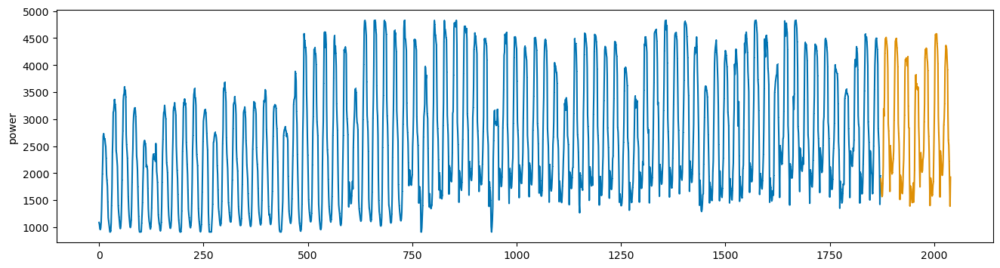

In [15]:
## 1번 건물의 발전량
y = train.loc[train.build_num == 1, 'power']
x = train.loc[train.build_num == 1, ].drop(columns=['num_date_time','build_num','date_time','power'])

y_train, y_valid, x_train, x_valid = temporal_train_test_split(y = y, X = x, test_size = 168) # 24시간*7일 = 168

print('train data shape\nx:{}, y:{}'.format(x_train.shape, y_train.shape))

plot_series(y_train, y_valid, markers=[',' , ','])
plt.show()

## 2. Model : XGBoost

In [16]:
# Define SMAPE loss function
def SMAPE(true, pred):
    return np.mean((np.abs(true-pred))/(np.abs(true) + np.abs(pred))) * 100

# Define the custom metric
def smape(y_true, y_pred):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    numerator = np.abs(y_true - y_pred) / (np.abs(y_true) + np.abs(y_pred))
    return np.mean(numerator) * 100

In [23]:
#건물별로 시간마다 과소초정, 과대추정이 다르므로 각각 가중치를 두는 모델을 만들어 앙상블
def over_weighted_mse(alpha = 1):
    def weighted_mse_fixed(label, pred):
        residual = (label - pred).astype("float")
        grad = np.where(residual<0, -2*alpha*residual, -2*residual)
        hess = np.where(residual<0, 2*alpha, 2.0)
        return grad, hess
    return weighted_mse_fixed

def under_weighted_mse(alpha = 1):
    def weighted_mse_fixed(label, pred):
        residual = (label - pred).astype("float")
        grad = np.where(residual>0, -2*alpha*residual, -2*residual)
        hess = np.where(residual>0, 2*alpha, 2.0)
        return grad, hess
    return weighted_mse_fixed

## 3. model tuning

### alpha tuning for weighted MSE

In [26]:
#over predict

over_alpha_list = []
smape_list = []
for i in tqdm(range(100)):
    y = train.loc[train.build_num == i+1, 'power']
    x = train.loc[train.build_num == i+1, ].drop(columns=['num_date_time','build_num','date_time','power'])
    y_train, y_test, x_train, x_test = temporal_train_test_split(y = y, X = x, test_size = 168)
    xgb = XGBRegressor(n_estimators = 5000, eta = 0.03, min_child_weight = 6, 
                       max_depth = 12, colsample_bytree = 0.8, 
                       subsample = 0.9, seed = 42, 
                       eval_metric = smape,
                       tree_method="gpu_hist", enable_categorical = True)
    
    xgb.fit(x_train, y_train, eval_set=[(x_train, y_train), 
                                            (x_test, y_test)], early_stopping_rounds=300, verbose=False)
    pred0 = xgb.predict(x_test)
    best_alpha = 0
    score0 = SMAPE(y_test,pred0)
    
    for j in [1, 10, 50, 100]:
        xgb = XGBRegressor(n_estimators = 5000, eta = 0.03, min_child_weight = 6, 
                       max_depth = 12, colsample_bytree = 0.8, 
                       subsample = 0.9, seed = 42, 
                       eval_metric = smape,
                       tree_method="gpu_hist", enable_categorical = True)
        xgb.set_params(**{'objective' : over_weighted_mse(j)})
    
        xgb.fit(x_train, y_train, eval_set=[(x_train, y_train), 
                                            (x_test, y_test)], early_stopping_rounds=300, verbose=False)
        pred1 = xgb.predict(x_test)
        score1 = SMAPE(y_test, pred1)
        if score1 < score0:
            best_alpha = j
            score0 = score1
    
    over_alpha_list.append(best_alpha)
    smape_list.append(score0)
    print("building {} || best score : {} || alpha : {}".format(i+1, score0, best_alpha))

  1%|▊                                                                              | 1/100 [01:49<3:00:53, 109.63s/it]

building 1 || best score : 2.37285346051147 || alpha : 1


  2%|█▌                                                                             | 2/100 [03:45<3:05:02, 113.29s/it]

building 2 || best score : 4.0900206549101865 || alpha : 50


  3%|██▍                                                                             | 3/100 [04:46<2:24:31, 89.40s/it]

building 3 || best score : 4.58102396129769 || alpha : 10


  4%|███▏                                                                            | 4/100 [05:48<2:05:31, 78.45s/it]

building 4 || best score : 1.7824174058750852 || alpha : 10


  5%|███▉                                                                           | 5/100 [13:01<5:26:38, 206.30s/it]

building 5 || best score : 2.9563619892886623 || alpha : 50


  6%|████▋                                                                          | 6/100 [21:17<7:57:33, 304.82s/it]

building 6 || best score : 1.8423252981217628 || alpha : 100


  7%|█████▌                                                                         | 7/100 [22:58<6:09:34, 238.44s/it]

building 7 || best score : 3.975936939363933 || alpha : 0


  8%|██████▎                                                                        | 8/100 [24:31<4:54:36, 192.14s/it]

building 8 || best score : 2.213822626663751 || alpha : 0


  9%|███████                                                                        | 9/100 [26:06<4:05:12, 161.67s/it]

building 9 || best score : 1.8164631577126726 || alpha : 0


 10%|███████▊                                                                      | 10/100 [27:05<3:14:51, 129.91s/it]

building 10 || best score : 3.3460795039516698 || alpha : 1


 11%|████████▌                                                                     | 11/100 [28:57<3:04:33, 124.42s/it]

building 11 || best score : 1.5075111613537275 || alpha : 0


 12%|█████████▎                                                                    | 12/100 [38:43<6:28:31, 264.90s/it]

building 12 || best score : 2.0256121117831243 || alpha : 100


 13%|██████████▏                                                                   | 13/100 [50:28<9:37:35, 398.34s/it]

building 13 || best score : 2.827438545091518 || alpha : 100


 14%|██████████▉                                                                   | 14/100 [51:37<7:08:12, 298.75s/it]

building 14 || best score : 8.073752870204673 || alpha : 50


 15%|███████████▋                                                                  | 15/100 [52:54<5:28:28, 231.86s/it]

building 15 || best score : 1.6507912485853333 || alpha : 0


 16%|████████████▍                                                                 | 16/100 [54:02<4:15:37, 182.59s/it]

building 16 || best score : 1.9620051550111997 || alpha : 0


 17%|█████████████▎                                                                | 17/100 [55:32<3:34:12, 154.85s/it]

building 17 || best score : 2.6564168687755916 || alpha : 100


 18%|█████████████▋                                                              | 18/100 [1:00:56<4:40:49, 205.48s/it]

building 18 || best score : 3.4142596372681724 || alpha : 100


 19%|██████████████▍                                                             | 19/100 [1:09:29<6:42:20, 298.03s/it]

building 19 || best score : 3.911578360353781 || alpha : 10


 20%|███████████████▏                                                            | 20/100 [1:12:54<5:59:52, 269.91s/it]

building 20 || best score : 3.144388831191701 || alpha : 1


 21%|███████████████▉                                                            | 21/100 [1:18:19<6:17:24, 286.64s/it]

building 21 || best score : 3.0692384268007182 || alpha : 100


 22%|████████████████▋                                                           | 22/100 [1:20:21<5:08:03, 236.97s/it]

building 22 || best score : 1.9240809199179025 || alpha : 0


 23%|█████████████████▍                                                          | 23/100 [1:31:33<7:51:55, 367.73s/it]

building 23 || best score : 0.814004056147254 || alpha : 50


 24%|██████████████████▏                                                         | 24/100 [1:37:01<7:30:23, 355.58s/it]

building 24 || best score : 1.0738705210092176 || alpha : 100


 25%|███████████████████                                                         | 25/100 [1:40:04<6:19:49, 303.86s/it]

building 25 || best score : 0.9478747524170175 || alpha : 50


 26%|███████████████████▊                                                        | 26/100 [1:41:47<5:00:24, 243.57s/it]

building 26 || best score : 0.9263689421395724 || alpha : 1


 27%|████████████████████▌                                                       | 27/100 [1:48:02<5:44:20, 283.02s/it]

building 27 || best score : 0.6328876862984296 || alpha : 0


 28%|█████████████████████▎                                                      | 28/100 [1:49:12<4:23:00, 219.18s/it]

building 28 || best score : 1.6045672961463315 || alpha : 50


 29%|██████████████████████                                                      | 29/100 [1:50:45<3:34:36, 181.36s/it]

building 29 || best score : 1.8809682777110672 || alpha : 0


 30%|██████████████████████▊                                                     | 30/100 [1:52:39<3:08:03, 161.19s/it]

building 30 || best score : 3.373113022046871 || alpha : 10


 31%|███████████████████████▌                                                    | 31/100 [1:53:57<2:36:36, 136.18s/it]

building 31 || best score : 2.0229736547041584 || alpha : 50


 32%|████████████████████████▎                                                   | 32/100 [1:55:22<2:17:02, 120.91s/it]

building 32 || best score : 0.22910625725427922 || alpha : 0


 33%|█████████████████████████                                                   | 33/100 [1:58:09<2:30:19, 134.63s/it]

building 33 || best score : 0.18458231972941067 || alpha : 1


 34%|█████████████████████████▊                                                  | 34/100 [2:03:36<3:31:41, 192.45s/it]

building 34 || best score : 0.34897725720848366 || alpha : 0


 35%|██████████████████████████▌                                                 | 35/100 [2:11:42<5:03:42, 280.34s/it]

building 35 || best score : 0.23384841257893915 || alpha : 0


 36%|███████████████████████████▎                                                | 36/100 [2:24:06<7:27:24, 419.44s/it]

building 36 || best score : 0.1718133549071909 || alpha : 100


 37%|████████████████████████████                                                | 37/100 [2:38:58<9:49:21, 561.30s/it]

building 37 || best score : 2.170485318549776 || alpha : 100


 38%|████████████████████████████▉                                               | 38/100 [2:41:10<7:26:54, 432.49s/it]

building 38 || best score : 1.9874860099458096 || alpha : 100


 39%|█████████████████████████████▋                                              | 39/100 [2:46:28<6:44:45, 398.13s/it]

building 39 || best score : 2.8874703230691248 || alpha : 100


 40%|██████████████████████████████▍                                             | 40/100 [2:52:43<6:31:13, 391.23s/it]

building 40 || best score : 3.85429356497441 || alpha : 100


 41%|███████████████████████████████▏                                            | 41/100 [2:54:37<5:02:47, 307.93s/it]

building 41 || best score : 1.5673334754740216 || alpha : 1


 42%|███████████████████████████████▉                                            | 42/100 [2:57:52<4:24:54, 274.04s/it]

building 42 || best score : 6.393182462672227 || alpha : 1


 43%|████████████████████████████████▋                                           | 43/100 [3:00:21<3:44:44, 236.57s/it]

building 43 || best score : 2.5362122913022684 || alpha : 100


 44%|█████████████████████████████████▍                                          | 44/100 [3:01:43<2:57:36, 190.29s/it]

building 44 || best score : 1.5745055385311253 || alpha : 0


 45%|██████████████████████████████████▏                                         | 45/100 [3:08:11<3:48:47, 249.59s/it]

building 45 || best score : 0.998762952294536 || alpha : 100


 46%|██████████████████████████████████▉                                         | 46/100 [3:17:17<5:04:34, 338.41s/it]

building 46 || best score : 2.042192530174127 || alpha : 100


 47%|███████████████████████████████████▋                                        | 47/100 [3:20:39<4:23:00, 297.74s/it]

building 47 || best score : 2.024465023851193 || alpha : 10


 48%|████████████████████████████████████▍                                       | 48/100 [3:28:17<4:59:37, 345.73s/it]

building 48 || best score : 1.1203891726265744 || alpha : 100


 49%|█████████████████████████████████████▏                                      | 49/100 [3:36:29<5:31:10, 389.62s/it]

building 49 || best score : 0.9394011992364811 || alpha : 100


 50%|██████████████████████████████████████                                      | 50/100 [3:38:04<4:10:51, 301.02s/it]

building 50 || best score : 0.8012769668272942 || alpha : 0


 51%|██████████████████████████████████████▊                                     | 51/100 [3:48:25<5:24:22, 397.20s/it]

building 51 || best score : 2.2113207497198393 || alpha : 100


 52%|███████████████████████████████████████▌                                    | 52/100 [3:53:03<4:49:11, 361.50s/it]

building 52 || best score : 1.5878436098603652 || alpha : 50


 53%|████████████████████████████████████████▎                                   | 53/100 [3:54:11<3:34:05, 273.30s/it]

building 53 || best score : 5.733779073353143 || alpha : 100


 54%|█████████████████████████████████████████                                   | 54/100 [3:59:16<3:36:52, 282.88s/it]

building 54 || best score : 14.29416603510035 || alpha : 50


 55%|█████████████████████████████████████████▊                                  | 55/100 [4:00:48<2:49:09, 225.55s/it]

building 55 || best score : 0.7433061794740213 || alpha : 0


 56%|██████████████████████████████████████████▌                                 | 56/100 [4:04:30<2:44:39, 224.53s/it]

building 56 || best score : 0.29306544225182357 || alpha : 1


 57%|███████████████████████████████████████████▎                                | 57/100 [4:05:41<2:07:51, 178.41s/it]

building 57 || best score : 2.2575496902970267 || alpha : 50


 58%|████████████████████████████████████████████                                | 58/100 [4:11:25<2:39:46, 228.25s/it]

building 58 || best score : 0.2661081659363844 || alpha : 100


 59%|████████████████████████████████████████████▊                               | 59/100 [4:12:34<2:03:17, 180.43s/it]

building 59 || best score : 2.0916271946384204 || alpha : 10


 60%|█████████████████████████████████████████████▌                              | 60/100 [4:13:53<1:39:53, 149.83s/it]

building 60 || best score : 2.5739913204139544 || alpha : 10


 61%|██████████████████████████████████████████████▎                             | 61/100 [4:16:18<1:36:28, 148.43s/it]

building 61 || best score : 2.0064490103694395 || alpha : 0


 62%|███████████████████████████████████████████████                             | 62/100 [4:17:26<1:18:44, 124.33s/it]

building 62 || best score : 2.2793211652010665 || alpha : 50


 63%|███████████████████████████████████████████████▉                            | 63/100 [4:20:46<1:30:38, 146.98s/it]

building 63 || best score : 2.326334847459349 || alpha : 0


 64%|████████████████████████████████████████████████▋                           | 64/100 [4:21:48<1:12:59, 121.66s/it]

building 64 || best score : 1.8658721162300145 || alpha : 50


 65%|█████████████████████████████████████████████████▍                          | 65/100 [4:23:12<1:04:20, 110.31s/it]

building 65 || best score : 4.491618437484054 || alpha : 0


 66%|██████████████████████████████████████████████████▏                         | 66/100 [4:29:47<1:50:56, 195.78s/it]

building 66 || best score : 1.9668580908309024 || alpha : 100


 67%|██████████████████████████████████████████████████▉                         | 67/100 [4:30:44<1:24:44, 154.08s/it]

building 67 || best score : 2.259937112356462 || alpha : 1


 68%|███████████████████████████████████████████████████▋                        | 68/100 [4:31:46<1:07:24, 126.40s/it]

building 68 || best score : 2.087585175574137 || alpha : 1


 69%|█████████████████████████████████████████████████████▊                        | 69/100 [4:32:53<56:07, 108.62s/it]

building 69 || best score : 1.1253462328660198 || alpha : 10


 70%|█████████████████████████████████████████████████████▏                      | 70/100 [4:38:20<1:27:00, 174.02s/it]

building 70 || best score : 1.027601795519867 || alpha : 0


 71%|█████████████████████████████████████████████████████▉                      | 71/100 [4:44:57<1:56:29, 241.02s/it]

building 71 || best score : 1.9329179254013222 || alpha : 100


 72%|██████████████████████████████████████████████████████▋                     | 72/100 [4:54:03<2:35:10, 332.52s/it]

building 72 || best score : 2.7520346553079564 || alpha : 100


 73%|███████████████████████████████████████████████████████▍                    | 73/100 [4:56:23<2:03:38, 274.75s/it]

building 73 || best score : 1.435463947317677 || alpha : 1


 74%|████████████████████████████████████████████████████████▏                   | 74/100 [5:00:19<1:53:59, 263.07s/it]

building 74 || best score : 2.430169713603306 || alpha : 50


 75%|█████████████████████████████████████████████████████████                   | 75/100 [5:08:17<2:16:31, 327.67s/it]

building 75 || best score : 2.586490582485858 || alpha : 100


 76%|█████████████████████████████████████████████████████████▊                  | 76/100 [5:09:29<1:40:20, 250.85s/it]

building 76 || best score : 2.3018204338518795 || alpha : 100


 77%|██████████████████████████████████████████████████████████▌                 | 77/100 [5:11:05<1:18:24, 204.55s/it]

building 77 || best score : 1.0542194905498494 || alpha : 1


 78%|███████████████████████████████████████████████████████████▎                | 78/100 [5:17:09<1:32:32, 252.38s/it]

building 78 || best score : 1.3771854155179104 || alpha : 100


 79%|████████████████████████████████████████████████████████████                | 79/100 [5:23:26<1:41:23, 289.70s/it]

building 79 || best score : 1.71689841131961 || alpha : 100


 80%|████████████████████████████████████████████████████████████▊               | 80/100 [5:29:56<1:46:37, 319.88s/it]

building 80 || best score : 1.434956156195952 || alpha : 50


 81%|█████████████████████████████████████████████████████████████▌              | 81/100 [5:31:13<1:18:08, 246.78s/it]

building 81 || best score : 1.589604804009905 || alpha : 100


 82%|██████████████████████████████████████████████████████████████▎             | 82/100 [5:33:33<1:04:27, 214.84s/it]

building 82 || best score : 2.0588225243698766 || alpha : 100


 83%|████████████████████████████████████████████████████████████████▋             | 83/100 [5:35:30<52:35, 185.60s/it]

building 83 || best score : 1.1963751165870395 || alpha : 1


 84%|█████████████████████████████████████████████████████████████████▌            | 84/100 [5:40:13<57:17, 214.83s/it]

building 84 || best score : 1.1592841707238173 || alpha : 100


 85%|████████████████████████████████████████████████████████████████▌           | 85/100 [5:48:07<1:13:06, 292.43s/it]

building 85 || best score : 1.4949334694043688 || alpha : 50


 86%|███████████████████████████████████████████████████████████████████           | 86/100 [5:50:09<56:18, 241.29s/it]

building 86 || best score : 3.3733327337379304 || alpha : 10


 87%|██████████████████████████████████████████████████████████████████          | 87/100 [5:57:03<1:03:30, 293.08s/it]

building 87 || best score : 4.176058600165006 || alpha : 50


 88%|████████████████████████████████████████████████████████████████████▋         | 88/100 [5:59:10<48:39, 243.28s/it]

building 88 || best score : 1.764300128141178 || alpha : 50


 89%|█████████████████████████████████████████████████████████████████████▍        | 89/100 [6:00:26<35:25, 193.20s/it]

building 89 || best score : 2.2362331247160876 || alpha : 10


 90%|██████████████████████████████████████████████████████████████████████▏       | 90/100 [6:02:06<27:32, 165.23s/it]

building 90 || best score : 5.440276455220653 || alpha : 0


 91%|██████████████████████████████████████████████████████████████████████▉       | 91/100 [6:03:45<21:48, 145.42s/it]

building 91 || best score : 5.772764425540455 || alpha : 10


 92%|███████████████████████████████████████████████████████████████████████▊      | 92/100 [6:06:13<19:28, 146.00s/it]

building 92 || best score : 3.437070722418894 || alpha : 0


 93%|████████████████████████████████████████████████████████████████████████▌     | 93/100 [6:09:46<19:23, 166.23s/it]

building 93 || best score : 3.1204292592879086 || alpha : 0


 94%|█████████████████████████████████████████████████████████████████████████▎    | 94/100 [6:11:34<14:52, 148.78s/it]

building 94 || best score : 3.0570165434694427 || alpha : 0


 95%|██████████████████████████████████████████████████████████████████████████    | 95/100 [6:12:43<10:24, 124.92s/it]

building 95 || best score : 6.59522865432329 || alpha : 0


 96%|██████████████████████████████████████████████████████████████████████████▉   | 96/100 [6:13:51<07:10, 107.67s/it]

building 96 || best score : 1.3385957766438694 || alpha : 100


 97%|███████████████████████████████████████████████████████████████████████████▋  | 97/100 [6:16:52<06:29, 129.87s/it]

building 97 || best score : 2.615256804206372 || alpha : 100


 98%|████████████████████████████████████████████████████████████████████████████▍ | 98/100 [6:18:04<03:44, 112.30s/it]

building 98 || best score : 6.413226517156617 || alpha : 100


 99%|█████████████████████████████████████████████████████████████████████████████▏| 99/100 [6:19:23<01:42, 102.49s/it]

building 99 || best score : 1.3836712831416509 || alpha : 10


100%|█████████████████████████████████████████████████████████████████████████████| 100/100 [6:23:18<00:00, 229.99s/it]

building 100 || best score : 2.8222398088481975 || alpha : 100


In [27]:
#under predict

under_alpha_list = []
smape_list = []
for i in tqdm(range(100)):
    y = train.loc[train.build_num == i+1, 'power']
    x = train.loc[train.build_num == i+1, ].drop(columns=['num_date_time','build_num','date_time','power'])
    y_train, y_test, x_train, x_test = temporal_train_test_split(y = y, X = x, test_size = 168)
    xgb = XGBRegressor(n_estimators = 5000, eta = 0.03, min_child_weight = 6, 
                       max_depth = 12, colsample_bytree = 0.8, 
                       subsample = 0.9, seed = 42, 
                       eval_metric = smape,
                       tree_method="gpu_hist", enable_categorical = True)
    
    xgb.fit(x_train, y_train, eval_set=[(x_train, y_train), 
                                            (x_test, y_test)], early_stopping_rounds=300, verbose=False)
    pred0 = xgb.predict(x_test)
    best_alpha = 0
    score0 = SMAPE(y_test,pred0)
    
    for j in [1, 10, 50, 100]:
        xgb = XGBRegressor(n_estimators = 5000, eta = 0.03, min_child_weight = 6, 
                       max_depth = 12, colsample_bytree = 0.8, 
                       subsample = 0.9, seed = 42, 
                       eval_metric = smape,
                       tree_method="gpu_hist", enable_categorical = True)
        xgb.set_params(**{'objective' : under_weighted_mse(j)})
    
        xgb.fit(x_train, y_train, eval_set=[(x_train, y_train), 
                                            (x_test, y_test)], early_stopping_rounds=300, verbose=False)
        pred1 = xgb.predict(x_test)
        score1 = SMAPE(y_test, pred1)
        if score1 < score0:
            best_alpha = j
            score0 = score1
    
    under_alpha_list.append(best_alpha)
    smape_list.append(score0)
    print("building {} || best score : {} || alpha : {}".format(i+1, score0, best_alpha))

  1%|▊                                                                              | 1/100 [02:21<3:53:04, 141.26s/it]

building 1 || best score : 2.286213616142262 || alpha : 10


  2%|█▌                                                                             | 2/100 [04:30<3:39:25, 134.34s/it]

building 2 || best score : 4.298884902115994 || alpha : 0


  3%|██▎                                                                            | 3/100 [06:16<3:16:00, 121.25s/it]

building 3 || best score : 4.678642812018755 || alpha : 1


  4%|███▏                                                                           | 4/100 [07:59<3:02:29, 114.06s/it]

building 4 || best score : 1.7374209810709147 || alpha : 10


  5%|███▉                                                                           | 5/100 [10:54<3:35:08, 135.88s/it]

building 5 || best score : 2.96947219818709 || alpha : 10


  6%|████▋                                                                          | 6/100 [14:04<4:02:11, 154.60s/it]

building 6 || best score : 1.9557268699668635 || alpha : 1


  7%|█████▌                                                                         | 7/100 [28:13<9:51:24, 381.56s/it]

building 7 || best score : 3.975936939363933 || alpha : 0


  8%|██████▎                                                                        | 8/100 [30:16<7:38:41, 299.15s/it]

building 8 || best score : 2.213822626663751 || alpha : 0


  9%|███████                                                                        | 9/100 [36:16<8:02:40, 318.25s/it]

building 9 || best score : 1.8164631577126726 || alpha : 0


 10%|███████▊                                                                      | 10/100 [37:59<6:17:32, 251.69s/it]

building 10 || best score : 3.030696932530734 || alpha : 10


 11%|████████▌                                                                     | 11/100 [40:37<5:30:44, 222.97s/it]

building 11 || best score : 1.5075111613537275 || alpha : 0


 12%|█████████▎                                                                    | 12/100 [43:35<5:07:01, 209.33s/it]

building 12 || best score : 2.2162024843297443 || alpha : 1


 13%|██████████▏                                                                   | 13/100 [46:19<4:43:37, 195.60s/it]

building 13 || best score : 2.9932852320832004 || alpha : 0


 14%|██████████▉                                                                   | 14/100 [48:04<4:01:23, 168.42s/it]

building 14 || best score : 8.104759836804654 || alpha : 1


 15%|███████████▋                                                                  | 15/100 [50:08<3:39:14, 154.75s/it]

building 15 || best score : 1.6507912485853333 || alpha : 0


 16%|████████████▍                                                                 | 16/100 [51:55<3:16:36, 140.44s/it]

building 16 || best score : 1.9620051550111997 || alpha : 0


 17%|█████████████▎                                                                | 17/100 [54:40<3:24:25, 147.78s/it]

building 17 || best score : 2.668351713729791 || alpha : 0


 18%|██████████████                                                                | 18/100 [57:20<3:27:20, 151.71s/it]

building 18 || best score : 3.5497045299554184 || alpha : 1


 19%|██████████████▍                                                             | 19/100 [1:01:15<3:58:16, 176.50s/it]

building 19 || best score : 3.810284509392514 || alpha : 10


 20%|███████████████▏                                                            | 20/100 [1:03:59<3:50:18, 172.73s/it]

building 20 || best score : 2.677835333538642 || alpha : 100


 21%|███████████████▉                                                            | 21/100 [1:07:08<3:54:02, 177.76s/it]

building 21 || best score : 3.289798161422198 || alpha : 0


 22%|████████████████▋                                                           | 22/100 [1:10:36<4:02:44, 186.73s/it]

building 22 || best score : 1.9240809199179025 || alpha : 0


 23%|█████████████████▍                                                          | 23/100 [1:13:15<3:49:01, 178.46s/it]

building 23 || best score : 0.8464053170920403 || alpha : 100


 24%|██████████████████▏                                                         | 24/100 [1:16:27<3:51:07, 182.46s/it]

building 24 || best score : 1.102447689098487 || alpha : 10


 25%|███████████████████                                                         | 25/100 [1:19:02<3:38:01, 174.42s/it]

building 25 || best score : 1.0040866338951147 || alpha : 50


 26%|███████████████████▊                                                        | 26/100 [1:21:00<3:14:15, 157.50s/it]

building 26 || best score : 0.9263689421395724 || alpha : 1


 27%|████████████████████▌                                                       | 27/100 [1:23:28<3:08:09, 154.65s/it]

building 27 || best score : 0.6328876862984296 || alpha : 0


 28%|█████████████████████▎                                                      | 28/100 [1:25:11<2:46:53, 139.08s/it]

building 28 || best score : 1.6207254716524622 || alpha : 0


 29%|██████████████████████                                                      | 29/100 [1:27:14<2:38:46, 134.18s/it]

building 29 || best score : 1.8809682777110672 || alpha : 0


 30%|██████████████████████▊                                                     | 30/100 [1:30:04<2:49:01, 144.88s/it]

building 30 || best score : 3.340507553016473 || alpha : 50


 31%|███████████████████████▌                                                    | 31/100 [1:31:58<2:36:11, 135.82s/it]

building 31 || best score : 2.0431518253882994 || alpha : 1


 32%|████████████████████████▎                                                   | 32/100 [1:33:45<2:24:06, 127.15s/it]

building 32 || best score : 0.22776099338969286 || alpha : 10


 33%|█████████████████████████                                                   | 33/100 [1:36:26<2:33:20, 137.32s/it]

building 33 || best score : 0.18458231972941067 || alpha : 1


 34%|█████████████████████████▊                                                  | 34/100 [1:39:41<2:49:58, 154.52s/it]

building 34 || best score : 0.3424329279909422 || alpha : 100


 35%|██████████████████████████▌                                                 | 35/100 [1:42:48<2:57:51, 164.17s/it]

building 35 || best score : 0.21990396123669284 || alpha : 10


 36%|███████████████████████████▎                                                | 36/100 [1:45:22<2:52:00, 161.25s/it]

building 36 || best score : 0.18466147224303517 || alpha : 0


 37%|████████████████████████████                                                | 37/100 [1:48:55<3:05:34, 176.73s/it]

building 37 || best score : 2.369723585626462 || alpha : 0


 38%|████████████████████████████▉                                               | 38/100 [1:51:26<2:54:37, 168.99s/it]

building 38 || best score : 1.7348304746459542 || alpha : 50


 39%|█████████████████████████████▋                                              | 39/100 [1:53:52<2:44:48, 162.10s/it]

building 39 || best score : 2.89248929693511 || alpha : 0


 40%|██████████████████████████████▍                                             | 40/100 [1:56:07<2:34:00, 154.00s/it]

building 40 || best score : 4.067073152434529 || alpha : 1


 41%|███████████████████████████████▏                                            | 41/100 [2:01:22<3:18:59, 202.37s/it]

building 41 || best score : 1.5673334754740216 || alpha : 1


 42%|███████████████████████████████▉                                            | 42/100 [2:03:39<2:56:25, 182.50s/it]

building 42 || best score : 6.393182462672227 || alpha : 1


 43%|████████████████████████████████▋                                           | 43/100 [2:06:05<2:43:14, 171.83s/it]

building 43 || best score : 2.5494749684755855 || alpha : 100


 44%|█████████████████████████████████▍                                          | 44/100 [2:07:52<2:22:11, 152.35s/it]

building 44 || best score : 1.5745055385311253 || alpha : 0


 45%|██████████████████████████████████▏                                         | 45/100 [2:11:06<2:30:55, 164.65s/it]

building 45 || best score : 0.9986248391767144 || alpha : 10


 46%|██████████████████████████████████▉                                         | 46/100 [2:14:01<2:31:09, 167.96s/it]

building 46 || best score : 2.2354219257966403 || alpha : 1


 47%|███████████████████████████████████▋                                        | 47/100 [2:17:04<2:32:16, 172.39s/it]

building 47 || best score : 2.039749321121171 || alpha : 10


 48%|████████████████████████████████████▍                                       | 48/100 [2:20:52<2:43:43, 188.91s/it]

building 48 || best score : 1.1331874280405683 || alpha : 0


 49%|█████████████████████████████████████▏                                      | 49/100 [2:23:57<2:39:42, 187.90s/it]

building 49 || best score : 1.0084682289631266 || alpha : 1


 50%|██████████████████████████████████████                                      | 50/100 [2:26:07<2:22:10, 170.61s/it]

building 50 || best score : 0.8012769668272942 || alpha : 0


 51%|██████████████████████████████████████▊                                     | 51/100 [2:29:31<2:27:23, 180.48s/it]

building 51 || best score : 2.3698911824206195 || alpha : 50


 52%|███████████████████████████████████████▌                                    | 52/100 [2:32:29<2:23:51, 179.82s/it]

building 52 || best score : 1.5400666617143577 || alpha : 100


 53%|████████████████████████████████████████▎                                   | 53/100 [2:34:20<2:04:35, 159.05s/it]

building 53 || best score : 4.884240195764684 || alpha : 50


 54%|█████████████████████████████████████████                                   | 54/100 [2:36:56<2:01:13, 158.13s/it]

building 54 || best score : 14.237195689152099 || alpha : 10


 55%|█████████████████████████████████████████▊                                  | 55/100 [2:38:57<1:50:20, 147.13s/it]

building 55 || best score : 0.7194884941782892 || alpha : 10


 56%|██████████████████████████████████████████▌                                 | 56/100 [2:41:17<1:46:22, 145.07s/it]

building 56 || best score : 0.29306544225182357 || alpha : 1


 57%|███████████████████████████████████████████▎                                | 57/100 [2:43:17<1:38:33, 137.52s/it]

building 57 || best score : 2.296269466270574 || alpha : 0


 58%|████████████████████████████████████████████                                | 58/100 [2:45:38<1:36:54, 138.45s/it]

building 58 || best score : 0.21448913543429274 || alpha : 10


 59%|████████████████████████████████████████████▊                               | 59/100 [2:47:28<1:28:49, 130.00s/it]

building 59 || best score : 2.0979692809445147 || alpha : 10


 60%|█████████████████████████████████████████████▌                              | 60/100 [2:49:28<1:24:33, 126.83s/it]

building 60 || best score : 2.7216911988747903 || alpha : 10


 61%|██████████████████████████████████████████████▎                             | 61/100 [2:52:47<1:36:29, 148.45s/it]

building 61 || best score : 1.9085527515216836 || alpha : 50


 62%|███████████████████████████████████████████████                             | 62/100 [2:54:55<1:30:18, 142.59s/it]

building 62 || best score : 2.2902545682516315 || alpha : 1


 63%|███████████████████████████████████████████████▉                            | 63/100 [3:06:09<3:06:08, 301.86s/it]

building 63 || best score : 2.326334847459349 || alpha : 0


 64%|████████████████████████████████████████████████▋                           | 64/100 [3:08:05<2:27:34, 245.96s/it]

building 64 || best score : 1.685686819409507 || alpha : 10


 65%|█████████████████████████████████████████████████▍                          | 65/100 [3:10:18<2:03:44, 212.13s/it]

building 65 || best score : 4.491618437484054 || alpha : 0


 66%|██████████████████████████████████████████████████▏                         | 66/100 [3:14:02<2:02:15, 215.74s/it]

building 66 || best score : 2.142713218824484 || alpha : 100


 67%|██████████████████████████████████████████████████▉                         | 67/100 [3:15:51<1:41:01, 183.67s/it]

building 67 || best score : 2.258406472082586 || alpha : 10


 68%|███████████████████████████████████████████████████▋                        | 68/100 [3:17:46<1:27:02, 163.22s/it]

building 68 || best score : 2.087585175574137 || alpha : 1


 69%|████████████████████████████████████████████████████▍                       | 69/100 [3:19:36<1:15:58, 147.05s/it]

building 69 || best score : 1.058464361739583 || alpha : 50


 70%|█████████████████████████████████████████████████████▏                      | 70/100 [3:22:43<1:19:39, 159.32s/it]

building 70 || best score : 1.022863936847768 || alpha : 100


 71%|█████████████████████████████████████████████████████▉                      | 71/100 [3:25:39<1:19:21, 164.18s/it]

building 71 || best score : 1.8894173744120664 || alpha : 100


 72%|██████████████████████████████████████████████████████▋                     | 72/100 [3:28:44<1:19:31, 170.40s/it]

building 72 || best score : 2.784712911521178 || alpha : 0


 73%|███████████████████████████████████████████████████████▍                    | 73/100 [3:39:30<2:20:57, 313.24s/it]

building 73 || best score : 1.435463947317677 || alpha : 1


 74%|████████████████████████████████████████████████████████▏                   | 74/100 [3:42:01<1:54:36, 264.47s/it]

building 74 || best score : 2.5332818332120017 || alpha : 1


 75%|█████████████████████████████████████████████████████████                   | 75/100 [3:44:48<1:37:58, 235.15s/it]

building 75 || best score : 2.124659667495678 || alpha : 100


 76%|█████████████████████████████████████████████████████████▊                  | 76/100 [3:46:43<1:19:42, 199.25s/it]

building 76 || best score : 2.264772583992189 || alpha : 50


 77%|██████████████████████████████████████████████████████████▌                 | 77/100 [3:49:23<1:11:46, 187.22s/it]

building 77 || best score : 1.0542194905498494 || alpha : 1


 78%|███████████████████████████████████████████████████████████▎                | 78/100 [3:52:45<1:10:18, 191.74s/it]

building 78 || best score : 1.4548283270344853 || alpha : 0


 79%|████████████████████████████████████████████████████████████                | 79/100 [3:55:36<1:04:56, 185.53s/it]

building 79 || best score : 1.4669378373006594 || alpha : 50


 80%|████████████████████████████████████████████████████████████▊               | 80/100 [3:58:35<1:01:11, 183.57s/it]

building 80 || best score : 1.703820208080448 || alpha : 0


 81%|███████████████████████████████████████████████████████████████▏              | 81/100 [4:00:35<52:08, 164.66s/it]

building 81 || best score : 1.6561710039445479 || alpha : 1


 82%|███████████████████████████████████████████████████████████████▉              | 82/100 [4:03:20<49:22, 164.56s/it]

building 82 || best score : 2.03275258726918 || alpha : 100


 83%|████████████████████████████████████████████████████████████████▋             | 83/100 [4:06:03<46:33, 164.33s/it]

building 83 || best score : 1.1963751165870395 || alpha : 1


 84%|█████████████████████████████████████████████████████████████████▌            | 84/100 [4:09:12<45:43, 171.46s/it]

building 84 || best score : 1.2376790773638138 || alpha : 0


 85%|██████████████████████████████████████████████████████████████████▎           | 85/100 [4:12:08<43:15, 173.05s/it]

building 85 || best score : 1.5196262705243893 || alpha : 1


 86%|███████████████████████████████████████████████████████████████████           | 86/100 [4:15:07<40:45, 174.70s/it]

building 86 || best score : 3.431425905209714 || alpha : 1


 87%|███████████████████████████████████████████████████████████████████▊          | 87/100 [4:22:06<53:42, 247.91s/it]

building 87 || best score : 4.0018581865894545 || alpha : 100


 88%|████████████████████████████████████████████████████████████████████▋         | 88/100 [4:25:00<45:11, 225.96s/it]

building 88 || best score : 1.590512983785433 || alpha : 100


 89%|█████████████████████████████████████████████████████████████████████▍        | 89/100 [4:27:00<35:35, 194.10s/it]

building 89 || best score : 2.2552134687410472 || alpha : 10


 90%|██████████████████████████████████████████████████████████████████████▏       | 90/100 [4:29:37<30:28, 182.85s/it]

building 90 || best score : 5.440276455220653 || alpha : 0


 91%|██████████████████████████████████████████████████████████████████████▉       | 91/100 [4:33:23<29:23, 195.96s/it]

building 91 || best score : 5.897302384660948 || alpha : 1


 92%|███████████████████████████████████████████████████████████████████████▊      | 92/100 [4:38:50<31:22, 235.29s/it]

building 92 || best score : 3.437070722418894 || alpha : 0


 93%|████████████████████████████████████████████████████████████████████████▌     | 93/100 [4:41:35<24:58, 214.02s/it]

building 93 || best score : 3.115217538502772 || alpha : 50


 94%|█████████████████████████████████████████████████████████████████████████▎    | 94/100 [4:44:20<19:56, 199.44s/it]

building 94 || best score : 3.0570165434694427 || alpha : 0


 95%|██████████████████████████████████████████████████████████████████████████    | 95/100 [4:46:04<14:14, 170.83s/it]

building 95 || best score : 6.59522865432329 || alpha : 0


 96%|██████████████████████████████████████████████████████████████████████████▉   | 96/100 [4:47:57<10:13, 153.34s/it]

building 96 || best score : 1.3726198061732808 || alpha : 1


 97%|███████████████████████████████████████████████████████████████████████████▋  | 97/100 [4:50:59<08:06, 162.04s/it]

building 97 || best score : 2.854368722071106 || alpha : 0


 98%|████████████████████████████████████████████████████████████████████████████▍ | 98/100 [4:52:56<04:57, 148.52s/it]

building 98 || best score : 6.619204292667162 || alpha : 0


 99%|█████████████████████████████████████████████████████████████████████████████▏| 99/100 [4:54:58<02:20, 140.57s/it]

building 99 || best score : 1.3933707066046621 || alpha : 0


100%|█████████████████████████████████████████████████████████████████████████████| 100/100 [4:57:37<00:00, 178.57s/it]

building 100 || best score : 2.9969662213295183 || alpha : 0


## 4. test inference

### preprocessing for test data

In [28]:
# train set과 동일한 전처리 과정
cols = ['num_date_time', 'build_num', 'date_time', 'temp' , 'prec', 'wind', 'hum']
test.columns = cols

# 시간 관련 변수들 생성
date = pd.to_datetime(test.date_time)
test['date'] = date.dt.date
test['hour'] = date.dt.hour
test['day'] = date.dt.day
test['weekday'] = date.dt.weekday
test['month'] = date.dt.month

test['holiday'] = test.apply(lambda x : 0 if x['weekday']<5 else 1, axis = 1)

## 일조
tqdm.pandas()
test['isolation'] = np.round(test.progress_apply(lambda x : isolation.loc[(isolation.build_num == x['build_num']) & (isolation.hour == x['hour']) & (isolation.month == x['month']) ,'isolation'].values[0], axis = 1), 1)

## 일사
tqdm.pandas()
test['sunshine'] = np.round(test.progress_apply(lambda x : sunshine.loc[(sunshine.build_num == x['build_num']) & (sunshine.hour == x['hour']) & (sunshine.month == x['month']) ,'sunshine'].values[0], axis = 1), 2)

## 건물별, 요일별, 시간별 전력소비량 평균
tqdm.pandas()
test['target_mean_1'] = test.progress_apply(lambda x : power_mean_1.loc[(power_mean_1.build_num == x['build_num']) & (power_mean_1.hour == x['hour']) & (power_mean_1.weekday == x['weekday']) ,'power'].values[0], axis = 1)

## 건물별, 요일별, 시간별 전력소비량 표준편차
tqdm.pandas()
test['target_std_1'] = test.progress_apply(lambda x : power_std_1.loc[(power_std_1.build_num == x['build_num']) & (power_std_1.hour == x['hour']) & (power_std_1.weekday == x['weekday']) ,'power'].values[0], axis = 1)

test['sin_hour'] = np.sin(2*np.pi*test.hour/24)
test['cos_hour'] = np.cos(2*np.pi*test.hour/24)
test['sin_date'] = -np.sin(2 * np.pi * (test['month']+test['day']/31)/12)
test['cos_date'] = -np.cos(2 * np.pi * (test['month']+test['day']/31)/12)
test['sin_month'] = -np.sin(2 * np.pi * test['month']/12.0)
test['cos_month'] = -np.cos(2 * np.pi * test['month']/12.0)
test['sin_weekday'] = -np.sin(2 * np.pi * (test['weekday']+1)/7.0)
test['cos_weekday'] = -np.cos(2 * np.pi * (test['weekday']+1)/7.0)

## 화씨 온도
test['temp_F'] = (test['temp'] * 9/5) + 32 

## 체감 온도
test['temp2'] = 13.12 + 0.6215*test['temp'] - 11.37*(test['wind']*3.6)**0.16 + 0.3965*(test['wind']*3.6)**0.16*test['temp']

test['THI'] = 9/5*test['temp'] - 0.55*(1-test['hum']/100)*(9/5*test['hum']-26)+32

cdhs = np.array([])
for num in range(1,101,1):
    temp = test[test['build_num'] == num]
    cdh = CDH(temp['temp'].values)
    cdhs = np.concatenate([cdhs, cdh])
test['CDH'] = cdhs

## mean temperature
test = test.merge(test.groupby(['build_num','date'])['temp'].mean().reset_index().rename(columns = {'temp':'mean_temp'}), on = ['build_num','date'], how = 'left')

## min temperature
test = test.merge(test.groupby(['build_num','date'])['temp'].min().reset_index().rename(columns = {'temp':'min_temp'}), on = ['build_num','date'], how = 'left')

## max temperature
test = test.merge(test.groupby(['build_num','date'])['temp'].max().reset_index().rename(columns = {'temp':'max_temp'}), on = ['build_num','date'], how = 'left')

## mean windspeed
test = test.merge(test.groupby(['build_num','date'])['wind'].mean().reset_index().rename(columns = {'wind':'mean_wind'}), on = ['build_num','date'], how = 'left')

## min windspeed
test = test.merge(test.groupby(['build_num','date'])['wind'].min().reset_index().rename(columns = {'wind':'min_wind'}), on = ['build_num','date'], how = 'left')

## max windspeed
test = test.merge(test.groupby(['build_num','date'])['wind'].max().reset_index().rename(columns = {'wind':'max_wind'}), on = ['build_num','date'], how = 'left')

## mean THI
test = test.merge(test.groupby(['build_num','date'])['THI'].mean().reset_index().rename(columns = {'THI':'mean_THI'}), on = ['build_num','date'], how = 'left')

## min THI
test = test.merge(test.groupby(['build_num','date'])['THI'].min().reset_index().rename(columns = {'THI':'min_THI'}), on = ['build_num','date'], how = 'left')

## max THI
test = test.merge(test.groupby(['build_num','date'])['THI'].max().reset_index().rename(columns = {'THI':'max_THI'}), on = ['build_num','date'], how = 'left')

## mean CDH
test = test.merge(test.groupby(['build_num','date'])['CDH'].mean().reset_index().rename(columns = {'CDH':'mean_CDH'}), on = ['build_num','date'], how = 'left')

## min CDH
test = test.merge(test.groupby(['build_num','date'])['CDH'].min().reset_index().rename(columns = {'CDH':'min_CDH'}), on = ['build_num','date'], how = 'left')

## max CDH
test = test.merge(test.groupby(['build_num','date'])['CDH'].max().reset_index().rename(columns = {'CDH':'max_CDH'}), on = ['build_num','date'], how = 'left')

test.drop(['date_time', 'date', 'day', 'weekday'], axis = 1, inplace = True)

test.head()

100%|██████████████████████████████████████████████████████████████████████████| 16800/16800 [00:11<00:00, 1440.50it/s]


,num_date_time,build_num,temp,prec,wind,hum,hour,month,holiday,isolation,sunshine,target_mean_1,target_std_1,sin_hour,cos_hour,...,temp2,THI,CDH,mean_temp,min_temp,max_temp,mean_wind,min_wind,max_wind,mean_THI,min_THI,max_THI,mean_CDH,min_CDH,max_CDH
0,1_20220825 00,1,23.5,0.0,2.2,72,0,8,0,0.0,0.0,1627.8000,446.984913,0.000000,1.000000,...,24.867486,58.3456,-2.5,22.408333,21.2,24.0,1.825,0.6,3.0,58.943692,53.9941,65.02,-31.825,-44.6,-2.5
1,1_20220825 01,1,23.0,0.0,0.9,72,1,8,0,0.0,0.0,1550.0800,449.091398,0.258819,0.965926,...,24.698272,57.4456,-5.5,22.408333,21.2,24.0,1.825,0.6,3.0,58.943692,53.9941,65.02,-31.825,-44.6,-2.5
2,1_20220825 02,1,22.7,0.0,1.5,75,2,8,0,0.0,0.0,1434.4272,410.726104,0.500000,0.866025,...,24.124701,57.8725,-8.8,22.408333,21.2,24.0,1.825,0.6,3.0,58.943692,53.9941,65.02,-31.825,-44.6,-2.5
3,1_20220825 03,1,22.1,0.0,1.3,78,3,8,0,0.0,0.0,1378.6272,368.910232,0.707107,0.707107,...,23.517516,57.9376,-12.7,22.408333,21.2,24.0,1.825,0.6,3.0,58.943692,53.9941,65.02,-31.825,-44.6,-2.5
4,1_20220825 04,1,21.8,0.0,1.0,77,4,8,0,0.0,0.0,1383.5736,357.624871,0.866025,0.500000,...,23.322268,56.9961,-16.9,22.408333,21.2,24.0,1.825,0.6,3.0,58.943692,53.9941,65.02,-31.825,-44.6,-2.5


### KFold ensemble
#### - 모델의 일반화 성능개선을 위해 Out-Of-KFold ensemble을 사용하였습니다.

In [29]:
test['hour'] = test['hour'].astype('category')
test['month'] = test['month'].astype('category')
test['holiday'] = test['holiday'].astype('category')

In [30]:
n_splits = 5
cv = KFold(n_splits=n_splits, shuffle=False)

In [32]:
over_preds = np.array([]) 
for i in tqdm(range(100)):
    
    pred_df = pd.DataFrame()   # fold별 예측값을 담을 data frame
    
    y_train = train.loc[train.build_num == i+1, 'power'].reset_index(drop=True)
    x_train, x_test = train.loc[train.build_num == i+1, ].drop(columns=['num_date_time','build_num','date_time','power']).reset_index(drop=True), test.loc[test.build_num == i+1, ].drop(columns=['num_date_time','build_num'])
    x_test = x_test[x_train.columns]
    fold = 0
    for tri, vai in cv.split(x_train):
        
        xgb = XGBRegressor(n_estimators = 5000, eta = 0.03, min_child_weight = 6, 
                       max_depth = 12, colsample_bytree = 0.8, 
                       subsample = 0.9, seed = 42, 
                       eval_metric = smape,
                       tree_method="gpu_hist", enable_categorical = True)
    
        if over_alpha_list[i] != 0:  # 만약 alpha가 0이 아니면 weighted_mse 사용
            xgb.set_params(**{'objective':over_weighted_mse(over_alpha_list[i])})
        
        xgb.fit(x_train.iloc[tri], y_train.iloc[tri],
               eval_set=[(x_train.iloc[vai], y_train[vai])],
               early_stopping_rounds=50, verbose=False)
        y_pred = xgb.predict(x_test)
        pred_df.loc[:,fold] = y_pred   # 각 fold별 예측 담기
        fold += 1
    pred = pred_df.mean(axis=1)        # (i+1)번째 건물의 예측 =  (i+1)번째 건물의 각 fold별 예측 평균값
    over_preds = np.append(over_preds, pred)   

100%|██████████████████████████████████████████████████████████████████████████████| 100/100 [2:44:10<00:00, 98.50s/it]


In [33]:
under_preds = np.array([]) 
for i in tqdm(range(100)):
    
    pred_df = pd.DataFrame()   # fold별 예측값을 담을 data frame
    
    y_train = train.loc[train.build_num == i+1, 'power'].reset_index(drop=True)
    x_train, x_test = train.loc[train.build_num == i+1, ].drop(columns=['num_date_time','build_num','date_time','power']).reset_index(drop=True), test.loc[test.build_num == i+1, ].drop(columns=['num_date_time','build_num'])
    x_test = x_test[x_train.columns]
    fold = 0
    for tri, vai in cv.split(x_train):
        
        xgb = XGBRegressor(n_estimators = 5000, eta = 0.03, min_child_weight = 6, 
                       max_depth = 12, colsample_bytree = 0.8, 
                       subsample = 0.9, seed = 42, 
                       eval_metric = smape,
                       tree_method="gpu_hist", enable_categorical = True)
    
        if under_alpha_list[i] != 0:  # 만약 alpha가 0이 아니면 weighted_mse 사용
            xgb.set_params(**{'objective':under_weighted_mse(under_alpha_list[i])})
        
        xgb.fit(x_train.iloc[tri], y_train.iloc[tri],
               eval_set=[(x_train.iloc[vai], y_train[vai])],
               early_stopping_rounds=50, verbose=False)
        y_pred = xgb.predict(x_test)
        pred_df.loc[:,fold] = y_pred   # 각 fold별 예측 담기
        fold += 1
    pred = pred_df.mean(axis=1)        # (i+1)번째 건물의 예측 =  (i+1)번째 건물의 각 fold별 예측 평균값
    under_preds = np.append(under_preds, pred) 

100%|██████████████████████████████████████████████████████████████████████████████| 100/100 [1:39:43<00:00, 59.84s/it]


In [36]:
preds = over_preds * 0.5 + under_preds * 0.5

In [37]:
submission = pd.read_csv('./data/sample_submission.csv')
submission['answer'] = preds
submission.to_csv('./submission/single/XGB_loss_ensemble.csv', index = False)

## 5. post processing

In [ ]:
#후처리
train_to_post = pd.read_csv('./data/train.csv')
train_to_post = train_to_post.drop(columns=['일조(hr)','일사(MJ/m2)'])

cols = ['num_date_time', 'build_num', 'date_time', 'temp','prec' ,'wind', 'hum', 'power']
train_to_post.columns = cols
date = pd.to_datetime(train_to_post.date_time)
train_to_post['hour'] = date.dt.hour
train_to_post['day'] = date.dt.weekday
train_to_post['month'] = date.dt.month
train_to_post['week'] = date.dt.weekofyear

pred_clip = []
test_to_post = pd.read_csv('./data/test.csv')
cols = ['num_date_time', 'build_num', 'date_time', 'temp','prec' ,'wind', 'hum']
test_to_post.columns = cols
date = pd.to_datetime(test_to_post.date_time)
test_to_post['hour'] = date.dt.hour
test_to_post['day'] = date.dt.weekday
test_to_post['month'] = date.dt.month
test_to_post['week'] = date.dt.weekofyear

## submission 불러오기
df = pd.read_csv('./submission/single/XGB_loss_ensemble.csv')

for i in range(100):
    
    max_data = train_to_post.loc[train_to_post.build_num == i+1, ].iloc[-28*24:, :] ## 건물별로 직전 28일의 데이터 불러오기
    
    ## 요일별, 시간대별 최대값 계산
    max_data = pd.pivot_table(max_data, values = 'power', index = ['day', 'hour'], aggfunc = max).reset_index()
    
    pred = df.answer[168*i:168*(i+1)].reset_index(drop=True) ## 168개 데이터, 즉 건물별 예측값 불러오기
    day =  test_to_post.day[168*i:168*(i+1)].reset_index(drop=True) ## 예측값 요일 불러오기
    hour = test_to_post.hour[168*i:168*(i+1)].reset_index(drop=True) ## 예측값 시간 불러오기
    
    df_pred = pd.concat([pred, day, hour], axis = 1)
    df_pred.columns = ['pred', 'day', 'hour']
    for j in range(len(df_pred)):
        
        max_power = max_data.loc[(max_data.day == df_pred.day[j])&(max_data.hour == df_pred.hour[j]), 'power'].values[0]
        
        if df_pred.pred[j] > max_power:
            pred_clip.append(max_power) 
        else:
            pred_clip.append(df_pred.pred[j])

##### 초록색으로 표시된 값이 원래의 예측값, 주황색이 후처리된 예측값입니다.
##### 변동이 거의 없는 건물도 있으나, 유의미하게 바뀐 건물도 확인됩니다. 

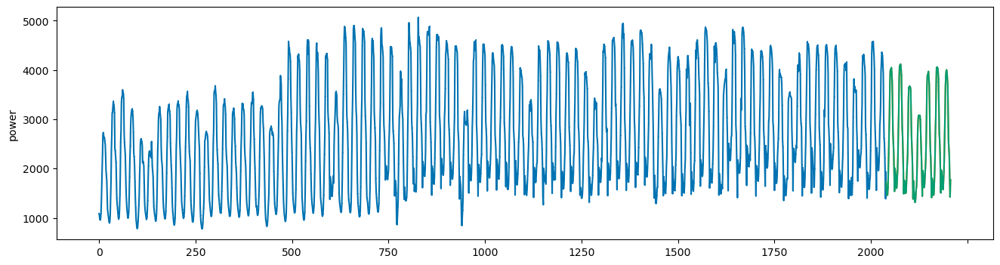

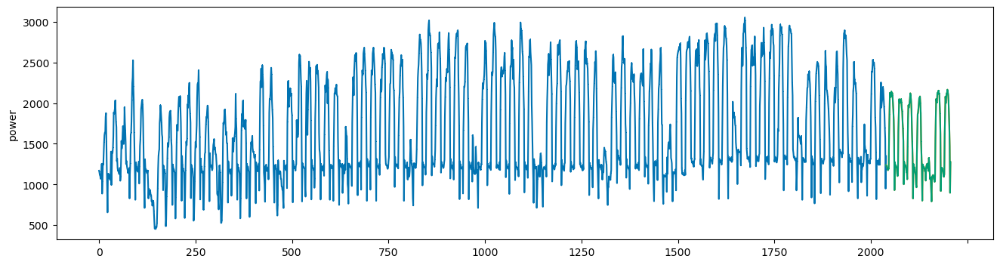

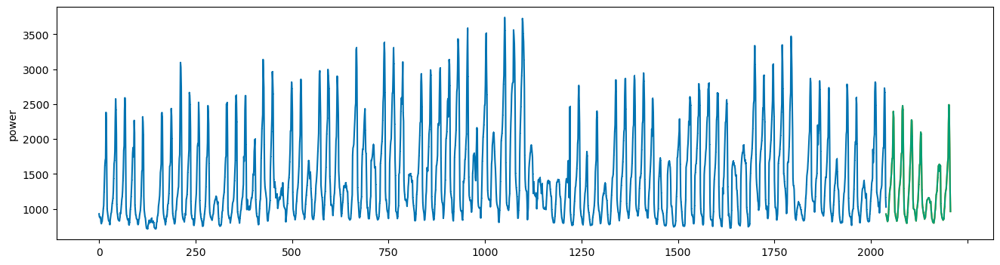

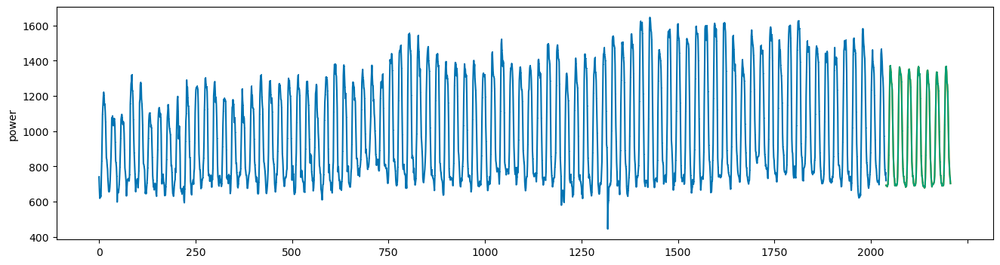

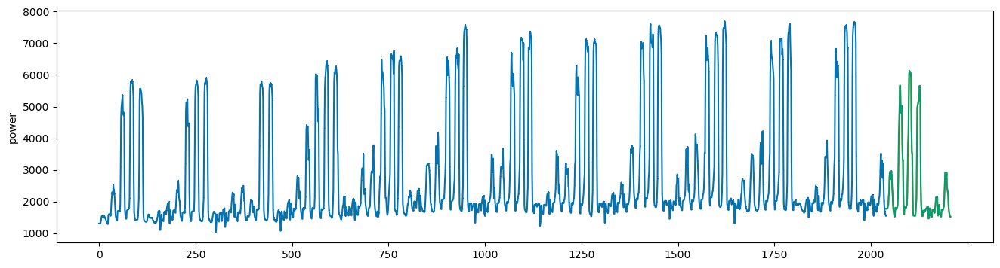

...

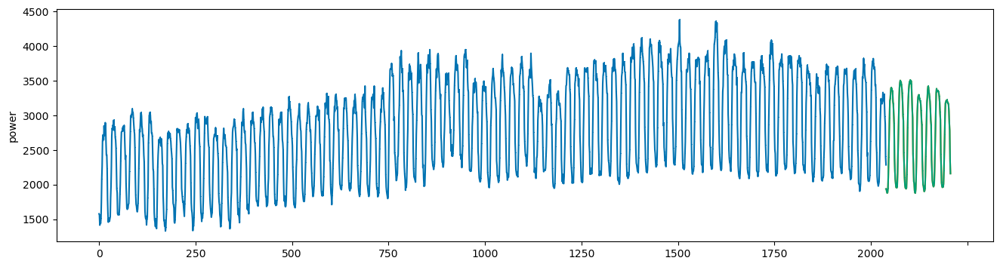

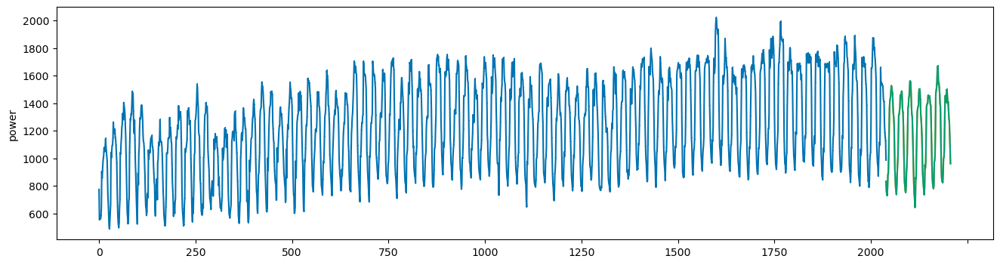

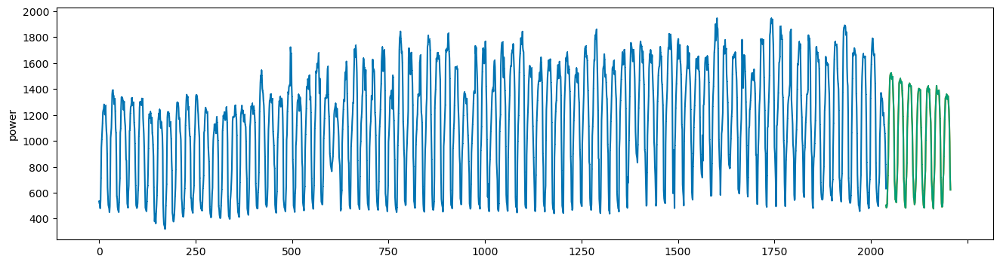

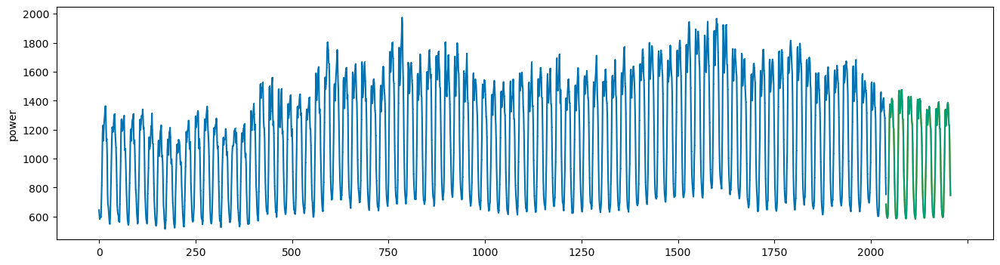

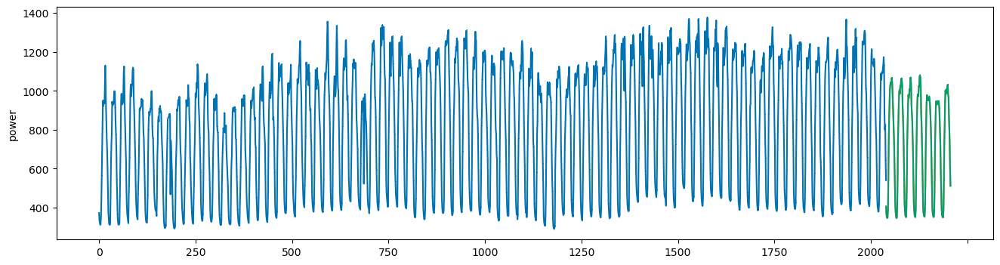

In [39]:
#후처리 최종
pred_origin = df.answer
pred_clip = pd.Series(pred_clip)

for i in range(100):
    power = train_to_post.loc[train_to_post.build_num == i+1, 'power'].reset_index(drop=True)
    preds = pred_clip[i*168:(i+1)*168]
    preds_origin = pred_origin[i*168:(i+1)*168]
    preds.index = range(power.index[-1], power.index[-1]+168)
    preds_origin.index = range(power.index[-1], power.index[-1]+168)
    
    plot_series(power, preds,  preds_origin, markers = [',', ',', ','])

#### create submission file 

In [46]:
submission = pd.read_csv('./data/sample_submission.csv')
submission['answer'] = pred_clip
submission.to_csv('./submission/single/XGB_loss_ensemble_finalclip.csv', index = False)